In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP
import scikitplot as skplt
from sklearn.preprocessing import LabelEncoder

from sleep_eeg.pre_processing.mq import *
from sleep_eeg.utils import *
from sleep_eeg.plotting.dimensionality_reduction import plot_lower_dimensional_subspace

/Users/wesleymonteith/miniconda3/envs/malm/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# 1. extracted_features_data

## 1.0 Load data

In [2]:
extracted_features_data = pd.read_csv("../data/eeg/df_corrected_110.csv", index_col=0)
extracted_features_data

,EEG E2_dwt_bounded_variation_band_0,EEG M2_dwt_bounded_variation_band_0,EEG E1_dwt_bounded_variation_band_0,EEG M1_dwt_bounded_variation_band_0,EEG Fp1_dwt_bounded_variation_band_0,EEG Fp2_dwt_bounded_variation_band_0,EEG F3_dwt_bounded_variation_band_0,EEG F4_dwt_bounded_variation_band_0,EEG C3_dwt_bounded_variation_band_0,EEG C4_dwt_bounded_variation_band_0,...,time_zero_crossing_derivative_ch_EEG T4,time_zero_crossing_derivative_ch_EEG T5,time_zero_crossing_derivative_ch_EEG T6,time_zero_crossing_derivative_ch_EEG Fz,time_zero_crossing_derivative_ch_EEG Pz,time_zero_crossing_derivative_ch_EEG Cz,time_zero_crossing_derivative_ch_EEG Oz,time_zero_crossing_derivative_ch_EEG A1,time_zero_crossing_derivative_ch_EEG A2,NAME
0,1249.326753,653.669743,1856.857403,637.846993,1682.339074,1828.124179,1154.282779,815.411050,1358.555096,1117.324054,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,A1_N3
1,709.820526,540.162387,1604.881501,535.652855,668.329742,1960.874225,503.762478,562.374925,758.759771,644.883428,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,A1_N4
2,1025.962497,724.226193,776.347678,576.039379,971.876928,1687.099203,3090.052078,1955.188019,3321.227981,2945.762128,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,A1_N5
3,1233.881724,495.743780,925.375552,494.097374,2165.945089,1616.596035,1429.680435,946.791357,748.516230,2053.970576,...,728092.0,745090.0,746093.0,738039.0,740712.0,721355.0,747716.0,757249.0,757249.0,A10_N3
4,1576.781751,1062.892737,859.725768,1057.026649,1186.842982,578.530308,921.054185,1429.861410,625.080459,2554.340973,...,741748.0,748340.0,753308.0,739427.0,739923.0,717064.0,754123.0,749016.0,749016.0,A10_N4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,973.987110,973.984264,973.992748,973.984170,973.977522,973.975035,973.979457,973.976074,973.986811,973.984111,...,716101.0,716105.0,716101.0,716104.0,716103.0,716100.0,716103.0,716102.0,716102.0,B08_N4
0,914.526341,914.523560,914.535476,914.523397,914.520111,914.513677,914.519981,914.514246,914.526705,914.521566,...,722559.0,722564.0,722560.0,722564.0,722560.0,722562.0,722561.0,722559.0,722561.0,B08_N5
0,1352.476959,1352.465817,1352.480339,1352.465650,1352.462693,1352.452798,1352.468934,1352.454071,1352.481076,1352.464068,...,687676.0,687675.0,687676.0,687677.0,687675.0,687674.0,687679.0,687681.0,687680.0,B09_N3
0,970.288415,970.275389,970.293957,970.275798,970.279527,970.275930,970.283461,970.277870,970.293256,970.288271,...,690229.0,690232.0,690231.0,690231.0,690231.0,690230.0,690231.0,690229.0,690234.0,B09_N4


In [3]:
extracted_features_data.index = rename_nights(extracted_features_data["NAME"])
extracted_features_data.drop(["NAME"], axis=1, inplace=True)
extracted_features_data.dropna(inplace=True)
extracted_features_data

,EEG E2_dwt_bounded_variation_band_0,EEG M2_dwt_bounded_variation_band_0,EEG E1_dwt_bounded_variation_band_0,EEG M1_dwt_bounded_variation_band_0,EEG Fp1_dwt_bounded_variation_band_0,EEG Fp2_dwt_bounded_variation_band_0,EEG F3_dwt_bounded_variation_band_0,EEG F4_dwt_bounded_variation_band_0,EEG C3_dwt_bounded_variation_band_0,EEG C4_dwt_bounded_variation_band_0,...,time_zero_crossing_derivative_ch_EEG T3,time_zero_crossing_derivative_ch_EEG T4,time_zero_crossing_derivative_ch_EEG T5,time_zero_crossing_derivative_ch_EEG T6,time_zero_crossing_derivative_ch_EEG Fz,time_zero_crossing_derivative_ch_EEG Pz,time_zero_crossing_derivative_ch_EEG Cz,time_zero_crossing_derivative_ch_EEG Oz,time_zero_crossing_derivative_ch_EEG A1,time_zero_crossing_derivative_ch_EEG A2
A01_N3,1249.326753,653.669743,1856.857403,637.846993,1682.339074,1828.124179,1154.282779,815.411050,1358.555096,1117.324054,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A01_N4,709.820526,540.162387,1604.881501,535.652855,668.329742,1960.874225,503.762478,562.374925,758.759771,644.883428,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A01_N5,1025.962497,724.226193,776.347678,576.039379,971.876928,1687.099203,3090.052078,1955.188019,3321.227981,2945.762128,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A10_N3,1233.881724,495.743780,925.375552,494.097374,2165.945089,1616.596035,1429.680435,946.791357,748.516230,2053.970576,...,722869.0,728092.0,745090.0,746093.0,738039.0,740712.0,721355.0,747716.0,757249.0,757249.0
A10_N4,1576.781751,1062.892737,859.725768,1057.026649,1186.842982,578.530308,921.054185,1429.861410,625.080459,2554.340973,...,739023.0,741748.0,748340.0,753308.0,739427.0,739923.0,717064.0,754123.0,749016.0,749016.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B08_N4,973.987110,973.984264,973.992748,973.984170,973.977522,973.975035,973.979457,973.976074,973.986811,973.984111,...,716100.0,716101.0,716105.0,716101.0,716104.0,716103.0,716100.0,716103.0,716102.0,716102.0
B08_N5,914.526341,914.523560,914.535476,914.523397,914.520111,914.513677,914.519981,914.514246,914.526705,914.521566,...,722561.0,722559.0,722564.0,722560.0,722564.0,722560.0,722562.0,722561.0,722559.0,722561.0
B09_N3,1352.476959,1352.465817,1352.480339,1352.465650,1352.462693,1352.452798,1352.468934,1352.454071,1352.481076,1352.464068,...,687677.0,687676.0,687675.0,687676.0,687677.0,687675.0,687674.0,687679.0,687681.0,687680.0
B09_N4,970.288415,970.275389,970.293957,970.275798,970.279527,970.275930,970.283461,970.277870,970.293256,970.288271,...,690229.0,690229.0,690232.0,690231.0,690231.0,690231.0,690230.0,690231.0,690229.0,690234.0


In [4]:
columns_to_keep = [
    column
    for column in extracted_features_data.columns
    if column.startswith("EEG") or column.startswith("time") or column.startswith("fft")
]

In [5]:
len(columns_to_keep)

1092

In [6]:
extracted_features_data = extracted_features_data[columns_to_keep]
extracted_features_data

,EEG E2_dwt_bounded_variation_band_0,EEG M2_dwt_bounded_variation_band_0,EEG E1_dwt_bounded_variation_band_0,EEG M1_dwt_bounded_variation_band_0,EEG Fp1_dwt_bounded_variation_band_0,EEG Fp2_dwt_bounded_variation_band_0,EEG F3_dwt_bounded_variation_band_0,EEG F4_dwt_bounded_variation_band_0,EEG C3_dwt_bounded_variation_band_0,EEG C4_dwt_bounded_variation_band_0,...,time_zero_crossing_derivative_ch_EEG T3,time_zero_crossing_derivative_ch_EEG T4,time_zero_crossing_derivative_ch_EEG T5,time_zero_crossing_derivative_ch_EEG T6,time_zero_crossing_derivative_ch_EEG Fz,time_zero_crossing_derivative_ch_EEG Pz,time_zero_crossing_derivative_ch_EEG Cz,time_zero_crossing_derivative_ch_EEG Oz,time_zero_crossing_derivative_ch_EEG A1,time_zero_crossing_derivative_ch_EEG A2
A01_N3,1249.326753,653.669743,1856.857403,637.846993,1682.339074,1828.124179,1154.282779,815.411050,1358.555096,1117.324054,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A01_N4,709.820526,540.162387,1604.881501,535.652855,668.329742,1960.874225,503.762478,562.374925,758.759771,644.883428,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A01_N5,1025.962497,724.226193,776.347678,576.039379,971.876928,1687.099203,3090.052078,1955.188019,3321.227981,2945.762128,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A10_N3,1233.881724,495.743780,925.375552,494.097374,2165.945089,1616.596035,1429.680435,946.791357,748.516230,2053.970576,...,722869.0,728092.0,745090.0,746093.0,738039.0,740712.0,721355.0,747716.0,757249.0,757249.0
A10_N4,1576.781751,1062.892737,859.725768,1057.026649,1186.842982,578.530308,921.054185,1429.861410,625.080459,2554.340973,...,739023.0,741748.0,748340.0,753308.0,739427.0,739923.0,717064.0,754123.0,749016.0,749016.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B08_N4,973.987110,973.984264,973.992748,973.984170,973.977522,973.975035,973.979457,973.976074,973.986811,973.984111,...,716100.0,716101.0,716105.0,716101.0,716104.0,716103.0,716100.0,716103.0,716102.0,716102.0
B08_N5,914.526341,914.523560,914.535476,914.523397,914.520111,914.513677,914.519981,914.514246,914.526705,914.521566,...,722561.0,722559.0,722564.0,722560.0,722564.0,722560.0,722562.0,722561.0,722559.0,722561.0
B09_N3,1352.476959,1352.465817,1352.480339,1352.465650,1352.462693,1352.452798,1352.468934,1352.454071,1352.481076,1352.464068,...,687677.0,687676.0,687675.0,687676.0,687677.0,687675.0,687674.0,687679.0,687681.0,687680.0
B09_N4,970.288415,970.275389,970.293957,970.275798,970.279527,970.275930,970.283461,970.277870,970.293256,970.288271,...,690229.0,690229.0,690232.0,690231.0,690231.0,690231.0,690230.0,690231.0,690229.0,690234.0


In [7]:
mq_full_night = load_mq_file()
mq_full_night = make_classification(mq_full_night)
mq_full_night

,Group,Participant,Night,Drug,mq_1_Sleeplatency,mq_2_times_awake,mq_3_time_lay_awake,mq_4_calm_sleep,mq_5_superficial_sleep,mq_6_recovery,mq_7_bad_mood,mq_8_energy,mq_9_tense,mq_10_unconcentrated
A01_N3,A,1.0,N3,0.0,60.0,1.0,10.0,1,1,0,1,1,3,2
A01_N4,A,1.0,N4,1.0,45.0,2.0,15.0,0,3,0,3,0,3,3
A01_N5,A,1.0,N5,2.0,30.0,1.0,5.0,1,2,2,3,1,3,1
A02_N3,A,2.0,N3,2.0,25.0,5.0,50.0,0,3,1,1,2,3,0
A02_N4,A,2.0,N4,0.0,24.0,5.0,53.0,1,1,2,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B23_N4,B,23.0,N4,2.0,5.0,3.0,15.0,2,1,2,1,3,1,0
B23_N5,B,23.0,N5,1.0,5.0,5.0,15.0,2,1,1,1,2,1,1
B24_N3,B,24.0,N3,2.0,10.0,4.0,12.0,0,2,3,0,3,1,0
B24_N4,B,24.0,N4,0.0,15.0,4.0,15.0,1,2,2,0,2,1,0


In [8]:
mq_full_night = mq_full_night.loc[
    mq_full_night.index.intersection(extracted_features_data.index)
]
extracted_features_data = extracted_features_data.loc[
    mq_full_night.index.intersection(extracted_features_data.index)
]
extracted_features_data = extracted_features_data.reindex(
    extracted_features_data.index.intersection(mq_full_night.index)
)
mq_full_night

,Group,Participant,Night,Drug,mq_1_Sleeplatency,mq_2_times_awake,mq_3_time_lay_awake,mq_4_calm_sleep,mq_5_superficial_sleep,mq_6_recovery,mq_7_bad_mood,mq_8_energy,mq_9_tense,mq_10_unconcentrated
A01_N3,A,1.0,N3,0.0,60.0,1.0,10.0,1,1,0,1,1,3,2
A01_N4,A,1.0,N4,1.0,45.0,2.0,15.0,0,3,0,3,0,3,3
A01_N5,A,1.0,N5,2.0,30.0,1.0,5.0,1,2,2,3,1,3,1
A02_N3,A,2.0,N3,2.0,25.0,5.0,50.0,0,3,1,1,2,3,0
A02_N4,A,2.0,N4,0.0,24.0,5.0,53.0,1,1,2,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B20_N3,B,20.0,N3,0.0,15.0,2.0,5.0,1,2,2,1,2,1,1
B20_N4,B,20.0,N4,2.0,60.0,1.0,3.0,0,3,1,2,0,3,1
B20_N5,B,20.0,N5,1.0,60.0,3.0,2.0,1,2,2,1,1,2,1
B21_N3,B,21.0,N3,0.0,28.0,1.0,1.0,2,0,2,1,2,2,1


In [9]:
extracted_features_data

,EEG E2_dwt_bounded_variation_band_0,EEG M2_dwt_bounded_variation_band_0,EEG E1_dwt_bounded_variation_band_0,EEG M1_dwt_bounded_variation_band_0,EEG Fp1_dwt_bounded_variation_band_0,EEG Fp2_dwt_bounded_variation_band_0,EEG F3_dwt_bounded_variation_band_0,EEG F4_dwt_bounded_variation_band_0,EEG C3_dwt_bounded_variation_band_0,EEG C4_dwt_bounded_variation_band_0,...,time_zero_crossing_derivative_ch_EEG T3,time_zero_crossing_derivative_ch_EEG T4,time_zero_crossing_derivative_ch_EEG T5,time_zero_crossing_derivative_ch_EEG T6,time_zero_crossing_derivative_ch_EEG Fz,time_zero_crossing_derivative_ch_EEG Pz,time_zero_crossing_derivative_ch_EEG Cz,time_zero_crossing_derivative_ch_EEG Oz,time_zero_crossing_derivative_ch_EEG A1,time_zero_crossing_derivative_ch_EEG A2
A01_N3,1249.326753,653.669743,1856.857403,637.846993,1682.339074,1828.124179,1154.282779,815.411050,1358.555096,1117.324054,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A01_N4,709.820526,540.162387,1604.881501,535.652855,668.329742,1960.874225,503.762478,562.374925,758.759771,644.883428,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A01_N5,1025.962497,724.226193,776.347678,576.039379,971.876928,1687.099203,3090.052078,1955.188019,3321.227981,2945.762128,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A02_N3,2664.073707,481.655995,3392.211450,697.388782,2360.325161,1347.266293,820.878094,2926.106222,2751.370986,2818.550543,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
A02_N4,980.955488,552.715042,2432.569377,546.214299,1255.988657,722.914098,1015.717417,446.213376,2271.689465,2075.406300,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B20_N3,3352.465454,1243.729006,1392.766099,1311.545679,3919.996161,3605.376848,4528.684419,3656.086209,1771.962035,1035.455656,...,686276.0,692062.0,705488.0,705478.0,670152.0,695199.0,667864.0,695846.0,688067.0,688067.0
B20_N4,864.232779,1616.494309,1615.542521,1664.825820,1998.790246,2838.001208,765.009849,799.436430,1223.387448,903.289293,...,685498.0,693483.0,705387.0,707840.0,677030.0,688322.0,673530.0,729174.0,683600.0,683600.0
B20_N5,792.064570,450.768213,1686.840485,466.484150,815.195672,502.744600,522.317119,882.981157,1519.883781,858.693854,...,704858.0,710515.0,724096.0,725091.0,698084.0,711858.0,689120.0,748904.0,709306.0,709306.0
B21_N3,917.838384,552.331131,2137.876916,566.469077,521.895435,1650.164910,1454.207461,467.485012,1112.571344,419.127030,...,694305.0,694523.0,707308.0,718422.0,667647.0,700578.0,674985.0,695695.0,704747.0,704748.0


In [10]:
scaler = StandardScaler()
scaler.set_output(transform="pandas")
std_extracted_features_data = scaler.fit_transform(extracted_features_data)
std_extracted_features_data

,EEG E2_dwt_bounded_variation_band_0,EEG M2_dwt_bounded_variation_band_0,EEG E1_dwt_bounded_variation_band_0,EEG M1_dwt_bounded_variation_band_0,EEG Fp1_dwt_bounded_variation_band_0,EEG Fp2_dwt_bounded_variation_band_0,EEG F3_dwt_bounded_variation_band_0,EEG F4_dwt_bounded_variation_band_0,EEG C3_dwt_bounded_variation_band_0,EEG C4_dwt_bounded_variation_band_0,...,time_zero_crossing_derivative_ch_EEG T3,time_zero_crossing_derivative_ch_EEG T4,time_zero_crossing_derivative_ch_EEG T5,time_zero_crossing_derivative_ch_EEG T6,time_zero_crossing_derivative_ch_EEG Fz,time_zero_crossing_derivative_ch_EEG Pz,time_zero_crossing_derivative_ch_EEG Cz,time_zero_crossing_derivative_ch_EEG Oz,time_zero_crossing_derivative_ch_EEG A1,time_zero_crossing_derivative_ch_EEG A2
A01_N3,-0.540273,-0.685328,-0.183630,-0.709685,-0.333007,-0.331395,-0.787278,-0.913356,-0.298998,-0.580686,...,-2.287771,-2.289048,-2.286159,-2.284392,-2.291338,-2.288681,-2.293287,-2.285405,-2.286773,-2.286773
A01_N4,-0.970853,-0.774840,-0.375976,-0.791365,-0.913474,-0.249669,-1.140631,-1.038812,-0.752661,-0.904881,...,-2.287771,-2.289048,-2.286159,-2.284392,-2.291338,-2.288681,-2.293287,-2.285405,-2.286773,-2.286773
A01_N5,-0.718540,-0.629687,-1.008437,-0.759086,-0.739709,-0.418215,0.264205,-0.348251,1.185492,0.674011,...,-2.287771,-2.289048,-2.286159,-2.284392,-2.291338,-2.288681,-2.293287,-2.285405,-2.286773,-2.286773
A02_N3,0.588836,-0.820978,0.988382,-0.662096,0.055105,-0.627429,-0.968378,0.133133,0.754474,0.586717,...,-2.287771,-2.289048,-2.286159,-2.284392,-2.291338,-2.288681,-2.293287,-2.285405,-2.286773,-2.286773
A02_N4,-0.754460,-0.764941,0.255839,-0.782924,-0.577070,-1.011803,-0.862545,-1.096405,0.391661,0.076762,...,-2.287771,-2.289048,-2.286159,-2.284392,-2.291338,-2.288681,-2.293287,-2.285405,-2.286773,-2.286773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B20_N3,1.138241,-0.220007,-0.537894,-0.171226,0.947935,0.762747,1.045650,0.495060,0.013687,-0.636865,...,0.357130,0.385721,0.377367,0.368122,0.306084,0.371890,0.302713,0.362006,0.339246,0.339246
B20_N4,-0.847616,0.073955,-0.367838,0.111137,-0.151855,0.290323,-0.998725,-0.921276,-0.401234,-0.727560,...,0.354132,0.391213,0.376986,0.377003,0.332743,0.345571,0.324737,0.488806,0.322198,0.322198
B20_N5,-0.905214,-0.845336,-0.313413,-0.846649,-0.829401,-1.147348,-1.130553,-0.879854,-0.176976,-0.758161,...,0.428745,0.457040,0.447621,0.441864,0.414345,0.435645,0.385336,0.563870,0.420305,0.420305
B21_N3,-0.804834,-0.765244,0.030886,-0.766735,-0.997300,-0.440953,-0.624363,-1.085859,-0.485051,-1.059798,...,0.388074,0.395232,0.384239,0.416790,0.296375,0.392475,0.330393,0.361432,0.402905,0.402910


## 1.1. PCA

In [11]:
pca_full_night = PCA()
pca_full_night_data = pca_full_night.fit_transform(std_extracted_features_data)
pd.DataFrame(pca_full_night_data, index=extracted_features_data.index).to_csv(
    "../data/pca_full_night_data.csv"
)
pca_full_night_data.shape

(107, 107)

[]

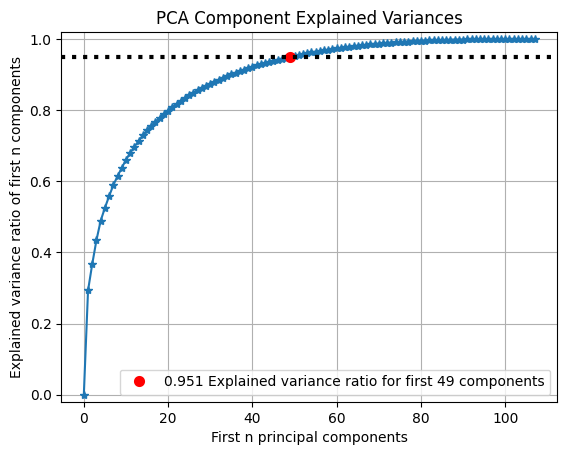

In [12]:
ax = skplt.decomposition.plot_pca_component_variance(
    pca_full_night, target_explained_variance=0.95
)
plt.plot()

In [13]:
mq_full_night

,Group,Participant,Night,Drug,mq_1_Sleeplatency,mq_2_times_awake,mq_3_time_lay_awake,mq_4_calm_sleep,mq_5_superficial_sleep,mq_6_recovery,mq_7_bad_mood,mq_8_energy,mq_9_tense,mq_10_unconcentrated
A01_N3,A,1.0,N3,0.0,60.0,1.0,10.0,1,1,0,1,1,3,2
A01_N4,A,1.0,N4,1.0,45.0,2.0,15.0,0,3,0,3,0,3,3
A01_N5,A,1.0,N5,2.0,30.0,1.0,5.0,1,2,2,3,1,3,1
A02_N3,A,2.0,N3,2.0,25.0,5.0,50.0,0,3,1,1,2,3,0
A02_N4,A,2.0,N4,0.0,24.0,5.0,53.0,1,1,2,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B20_N3,B,20.0,N3,0.0,15.0,2.0,5.0,1,2,2,1,2,1,1
B20_N4,B,20.0,N4,2.0,60.0,1.0,3.0,0,3,1,2,0,3,1
B20_N5,B,20.0,N5,1.0,60.0,3.0,2.0,1,2,2,1,1,2,1
B21_N3,B,21.0,N3,0.0,28.0,1.0,1.0,2,0,2,1,2,2,1


In [14]:
mq_full_night.columns

Index(['Group', 'Participant', 'Night', 'Drug', 'mq_1_Sleeplatency',
       'mq_2_times_awake', 'mq_3_time_lay_awake', 'mq_4_calm_sleep',
       'mq_5_superficial_sleep', 'mq_6_recovery', 'mq_7_bad_mood',
       'mq_8_energy', 'mq_9_tense', 'mq_10_unconcentrated'],
      dtype='object')

In [15]:
mq_full_night = pd.merge(mq_full_night, load_age_bmi_file())

In [16]:
mq_full_night.columns

Index(['Group', 'Participant', 'Night', 'Drug', 'mq_1_Sleeplatency',
       'mq_2_times_awake', 'mq_3_time_lay_awake', 'mq_4_calm_sleep',
       'mq_5_superficial_sleep', 'mq_6_recovery', 'mq_7_bad_mood',
       'mq_8_energy', 'mq_9_tense', 'mq_10_unconcentrated', 'Age (y)',
       'Sex (1=m, 2=f)', 'bmi (kg/m^2)'],
      dtype='object')

In [17]:
len(mq_full_night.columns)

17

In [18]:
mq_full_night["Group"].unique()

array(['A', 'B'], dtype=object)

In [19]:
mq_full_night["Group+Participant"] = mq_full_night["Group"].astype(str) + mq_full_night[
    "Participant"
].astype(str)

In [68]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder


def generate_fig(
    data: np.ndarray,
    mq: pd.DataFrame,
    dimensions: int = 2,
    classified_mqs: list[str] = [
        "Group",
        "Participant",
        "Group+Participant",
        "Night",
        "Drug",
        "mq_1_Sleeplatency",
        "mq_2_times_awake",
        "mq_3_time_lay_awake",
        "mq_4_calm_sleep",
        "mq_5_superficial_sleep",
        "mq_6_recovery",
        "mq_7_bad_mood",
        "mq_8_energy",
        "mq_9_tense",
        "mq_10_unconcentrated",
        "Age (y)",
        "Sex (1=m, 2=f)",
        "bmi (kg/m^2)",
    ],
    encode_name: list[str] = ["Group", "Night", "Group+Participant"],
    show: bool = True,
    figsize=(20, 30),
    ncols=4,
    nrows=5,
    xyz_component_labels="PCA",
):
    if dimensions == 3:
        subplot_kw = dict(projection="3d")
    else:
        subplot_kw = None
    fig, axes = plt.subplots(
        ncols=ncols,
        nrows=nrows,
        figsize=figsize,
        subplot_kw=subplot_kw,
        sharex=True,
        sharey=True,
    )

    for i, (ax, mq_name) in enumerate(zip(axes.flatten(), classified_mqs)):
        if mq_name in encode_name:
            c = LabelEncoder().fit_transform(mq[mq_name])
        else:
            c = mq[mq_name]

        if dimensions == 2:
            scatter = ax.scatter(
                x=data[:, 0],
                y=data[:, 1],
                c=c,
                alpha=0.5,
                cmap="viridis",
            )
            if i % 4 == 0:
                ax.set_ylabel(xyz_component_labels + " component 2")
            if i >= 4:
                ax.set_xlabel(xyz_component_labels + " component 1")

        elif dimensions == 3:
            scatter = ax.scatter(
                xs=data[:, 0],
                ys=data[:, 1],
                zs=data[:, 2],
                marker="o",
                c=c,
            )
            ax.set_xlabel(xyz_component_labels + " component 1")
            ax.set_ylabel(xyz_component_labels + " component 2")
            ax.set_zlabel(xyz_component_labels + " component 3")
        # produce a legend with the unique colors from the scatter
        ax.legend(
            *scatter.legend_elements(),
            # title=mq_name,
            # loc=loc,
            # bbox_to_anchor=(0.5, -0.05),
            fancybox=True,
            # shadow=True,
            ncol=1,
            fontsize=8,
            # loc="upper center",
            # bbox_to_anchor=(0.5, -0.05),
            loc="center left",
            bbox_to_anchor=(1, 0.5),
        )
        ax.set_title(mq_name)
    plt.tight_layout()
    if show:
        plt.show()
    return axes

In [69]:
rename_columns = {
    "Participant": "Participant ID",
    "mq_2_times_awake": "MQ2: Times awake",
    "mq_4_calm_sleep": "MQ4: Calm sleep",
    "mq_6_recovery": "MQ6: Recovery",
    "mq_8_energy": "MQ8: Energy",
    "mq_10_unconcentrated": "MQ10: Unconcentrated",
}
list(rename_columns.values())

['Participant ID',
 'MQ2: Times awake',
 'MQ4: Calm sleep',
 'MQ6: Recovery',
 'MQ8: Energy',
 'MQ10: Unconcentrated']

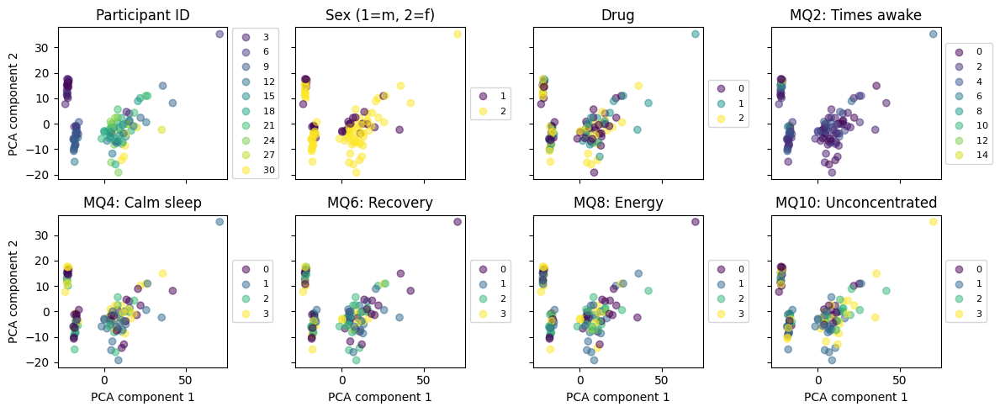

In [71]:
axes = generate_fig(
    pca_full_night_data,
    mq_full_night.rename(columns=rename_columns),
    dimensions=2,
    nrows=2,
    ncols=4,
    figsize=(12, 5),
    classified_mqs=[
        "Participant ID",
        "Sex (1=m, 2=f)",
        "Drug",
        "MQ2: Times awake",
        "MQ4: Calm sleep",
        "MQ6: Recovery",
        "MQ8: Energy",
        "MQ10: Unconcentrated",
    ],
    show=False,
)
plt.tight_layout()
plt.savefig(
    "../figures/pca_full_night_data_top_8_overlaid.png", bbox_inches="tight", dpi=400
)
plt.show()

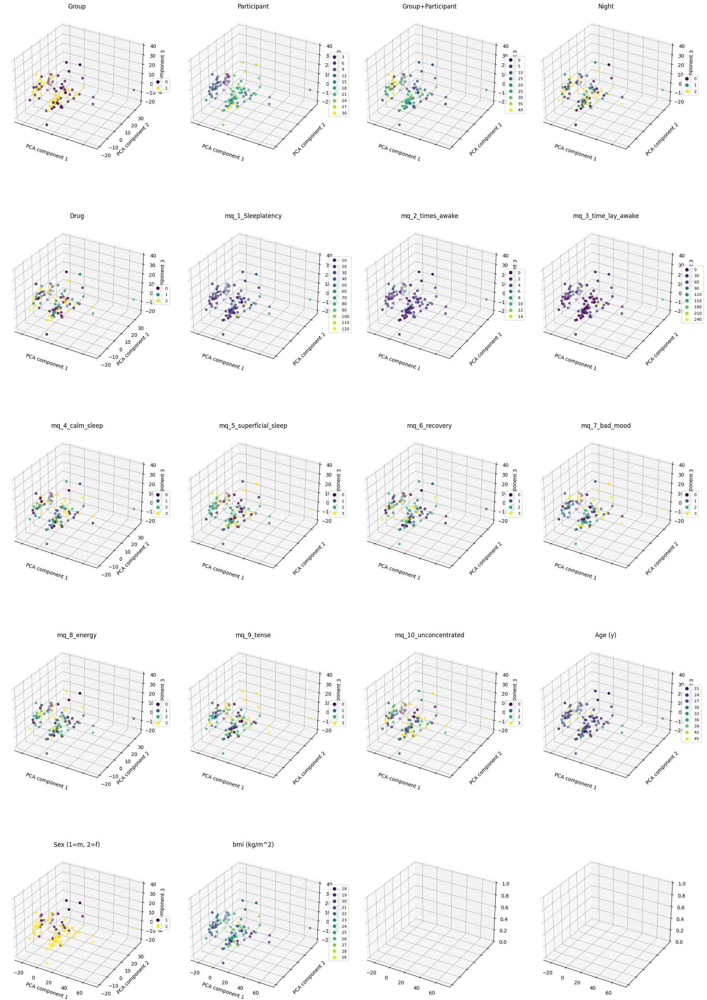

array([[<Axes3D: title={'center': 'Group'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>,
        <Axes3D: title={'center': 'Participant'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>,
        <Axes3D: title={'center': 'Group+Participant'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>,
        <Axes3D: title={'center': 'Night'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>],
       [<Axes3D: title={'center': 'Drug'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>,
        <Axes3D: title={'center': 'mq_1_Sleeplatency'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>,
        <Axes3D: title={'center': 'mq_2_times_awake'}, xlabel='PCA component 1', ylabel='PCA component 2', zlabel='PCA component 3'>,
        <Axes3D: title={'center': 'mq_3_time_lay_awake'}, xlabel='PCA component 1', ylabel='PCA co

In [72]:
plot_lower_dimensional_subspace(pca_full_night_data, mq_full_night, dimensions=3)

## 1.2 T-SNE

In [92]:
tsne_2D_full_night = TSNE(n_components=2)
tsne_2D_full_night_data = tsne_2D_full_night.fit_transform(std_extracted_features_data)
pd.DataFrame(tsne_2D_full_night_data, index=extracted_features_data.index).to_csv(
    "../data/tsne_2D_full_night_data.csv"
)
tsne_2D_full_night_data.shape

(107, 2)

In [93]:
mq_full_night = pd.merge(mq_full_night, load_age_bmi_file())

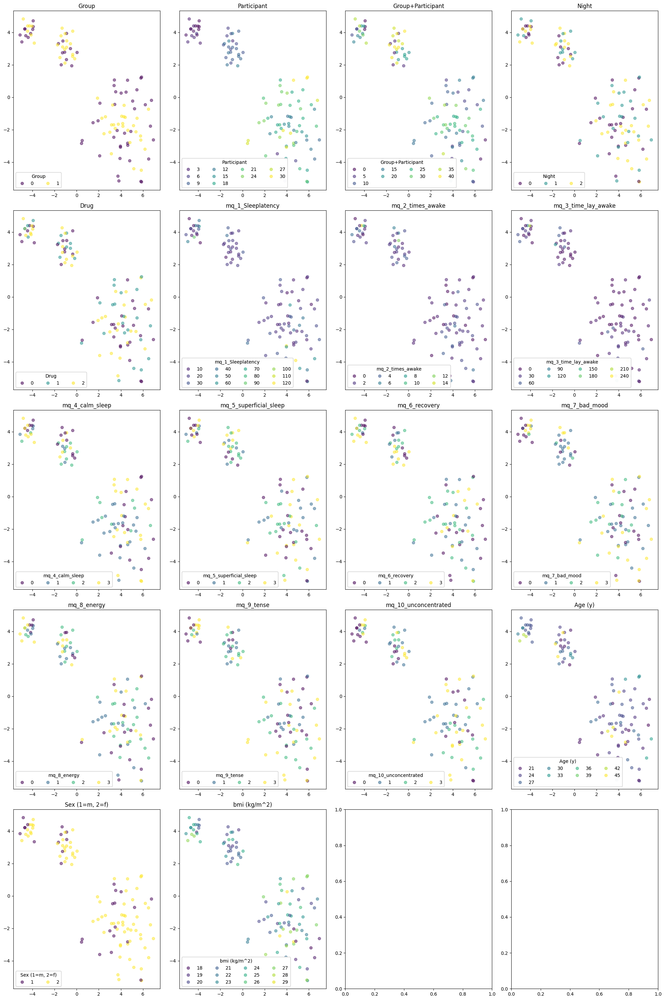

array([[<Axes: title={'center': 'Group'}>,
        <Axes: title={'center': 'Participant'}>,
        <Axes: title={'center': 'Group+Participant'}>,
        <Axes: title={'center': 'Night'}>],
       [<Axes: title={'center': 'Drug'}>,
        <Axes: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes: title={'center': 'mq_2_times_awake'}>,
        <Axes: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes: title={'center': 'mq_4_calm_sleep'}>,
        <Axes: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes: title={'center': 'mq_6_recovery'}>,
        <Axes: title={'center': 'mq_7_bad_mood'}>],
       [<Axes: title={'center': 'mq_8_energy'}>,
        <Axes: title={'center': 'mq_9_tense'}>,
        <Axes: title={'center': 'mq_10_unconcentrated'}>,
        <Axes: title={'center': 'Age (y)'}>],
       [<Axes: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes: title={'center': 'bmi (kg/m^2)'}>, <Axes: >, <Axes: >]],
      dtype=object)

In [94]:
plot_lower_dimensional_subspace(
    tsne_2D_full_night_data, mq_full_night, dimensions=2, loc="lower left"
)

In [95]:
tsne_3D_full_night = TSNE(n_components=3)
tsne_3D_full_night_data = tsne_3D_full_night.fit_transform(std_extracted_features_data)
pd.DataFrame(tsne_3D_full_night_data, index=extracted_features_data.index).to_csv(
    "../data/tsne_3D_full_night_data.csv"
)
tsne_3D_full_night_data.shape

(107, 3)

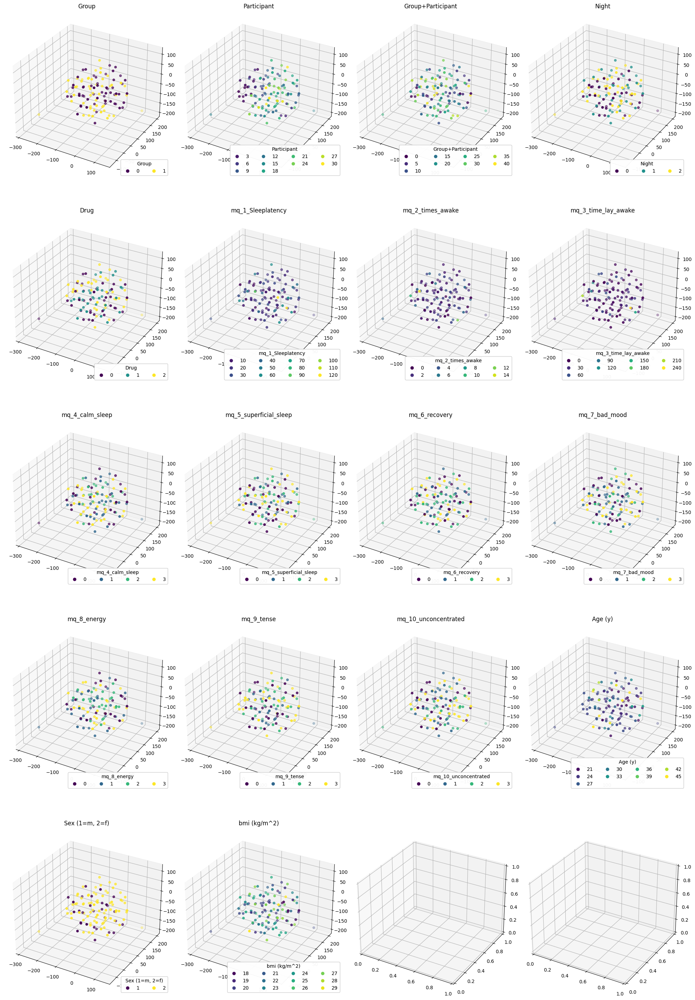

array([[<Axes3D: title={'center': 'Group'}>,
        <Axes3D: title={'center': 'Participant'}>,
        <Axes3D: title={'center': 'Group+Participant'}>,
        <Axes3D: title={'center': 'Night'}>],
       [<Axes3D: title={'center': 'Drug'}>,
        <Axes3D: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes3D: title={'center': 'mq_2_times_awake'}>,
        <Axes3D: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes3D: title={'center': 'mq_4_calm_sleep'}>,
        <Axes3D: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes3D: title={'center': 'mq_6_recovery'}>,
        <Axes3D: title={'center': 'mq_7_bad_mood'}>],
       [<Axes3D: title={'center': 'mq_8_energy'}>,
        <Axes3D: title={'center': 'mq_9_tense'}>,
        <Axes3D: title={'center': 'mq_10_unconcentrated'}>,
        <Axes3D: title={'center': 'Age (y)'}>],
       [<Axes3D: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes3D: title={'center': 'bmi (kg/m^2)'}>, <Axes3D: >,
        <Axes3D: >]], dtype=objec

In [96]:
plot_lower_dimensional_subspace(tsne_3D_full_night_data, mq_full_night, dimensions=3)

## 1.3 UMAP

In [97]:
umap_2D_full_night = UMAP(n_components=2)
umap_2D_full_night_data = umap_2D_full_night.fit_transform(std_extracted_features_data)
pd.DataFrame(umap_2D_full_night_data, index=extracted_features_data.index).to_csv(
    "../data/umap_2D_full_night_data.csv"
)
umap_2D_full_night_data.shape

(107, 2)

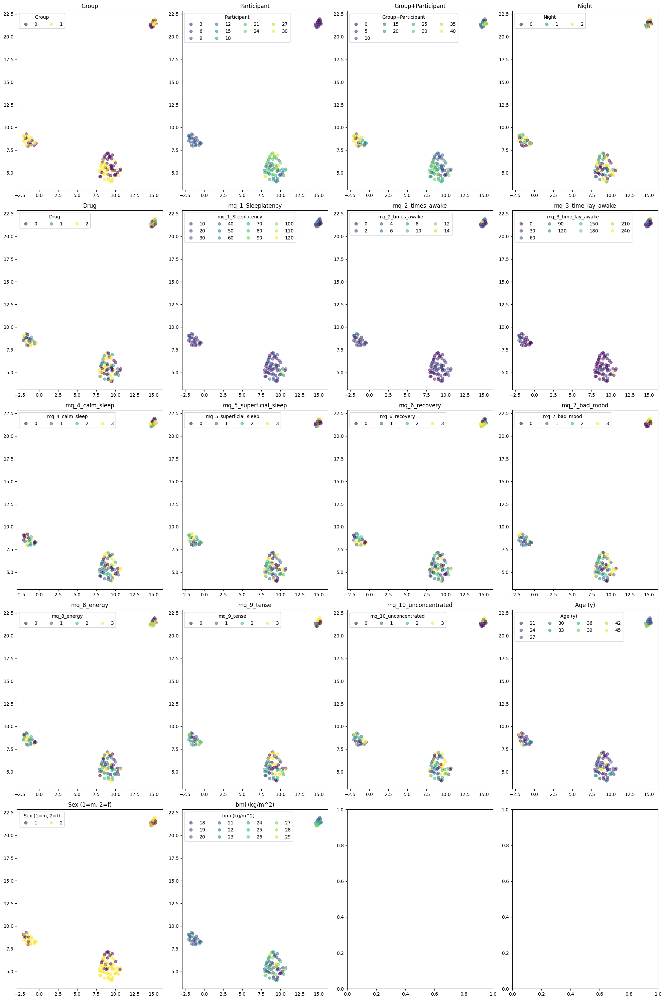

array([[<Axes: title={'center': 'Group'}>,
        <Axes: title={'center': 'Participant'}>,
        <Axes: title={'center': 'Group+Participant'}>,
        <Axes: title={'center': 'Night'}>],
       [<Axes: title={'center': 'Drug'}>,
        <Axes: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes: title={'center': 'mq_2_times_awake'}>,
        <Axes: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes: title={'center': 'mq_4_calm_sleep'}>,
        <Axes: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes: title={'center': 'mq_6_recovery'}>,
        <Axes: title={'center': 'mq_7_bad_mood'}>],
       [<Axes: title={'center': 'mq_8_energy'}>,
        <Axes: title={'center': 'mq_9_tense'}>,
        <Axes: title={'center': 'mq_10_unconcentrated'}>,
        <Axes: title={'center': 'Age (y)'}>],
       [<Axes: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes: title={'center': 'bmi (kg/m^2)'}>, <Axes: >, <Axes: >]],
      dtype=object)

In [101]:
plot_lower_dimensional_subspace(
    umap_2D_full_night_data, mq_full_night, dimensions=2, loc="upper left"
)

In [102]:
umap_3D_full_night = UMAP(n_components=3)
umap_3D_full_night_data = umap_3D_full_night.fit_transform(std_extracted_features_data)
pd.DataFrame(umap_3D_full_night_data, index=extracted_features_data.index).to_csv(
    "../data/umap_3D_full_night_data.csv"
)
umap_3D_full_night_data.shape

(107, 3)

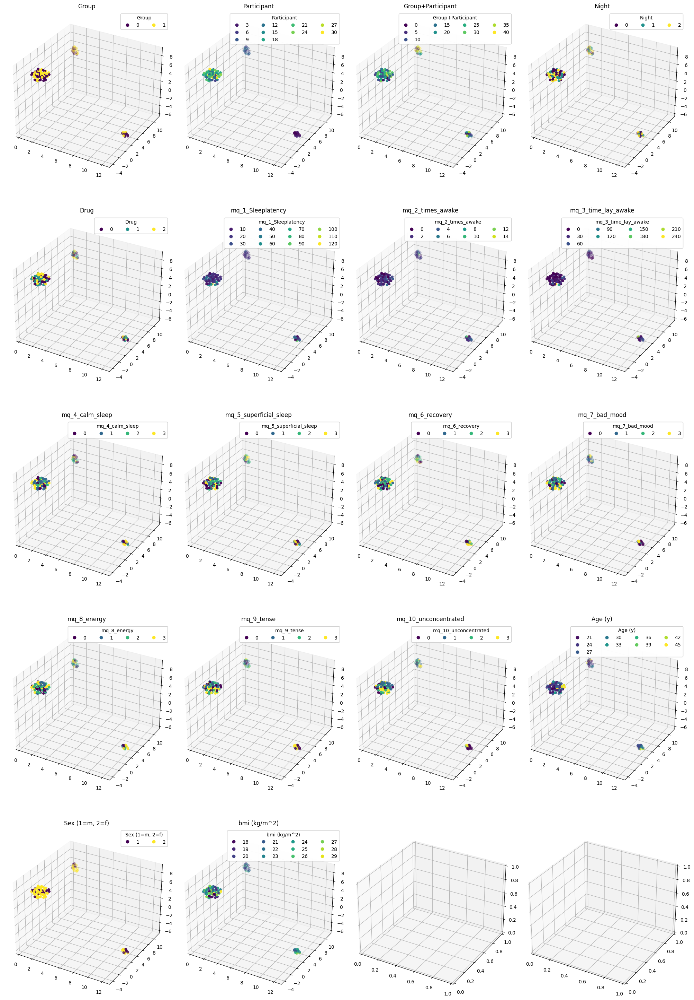

array([[<Axes3D: title={'center': 'Group'}>,
        <Axes3D: title={'center': 'Participant'}>,
        <Axes3D: title={'center': 'Group+Participant'}>,
        <Axes3D: title={'center': 'Night'}>],
       [<Axes3D: title={'center': 'Drug'}>,
        <Axes3D: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes3D: title={'center': 'mq_2_times_awake'}>,
        <Axes3D: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes3D: title={'center': 'mq_4_calm_sleep'}>,
        <Axes3D: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes3D: title={'center': 'mq_6_recovery'}>,
        <Axes3D: title={'center': 'mq_7_bad_mood'}>],
       [<Axes3D: title={'center': 'mq_8_energy'}>,
        <Axes3D: title={'center': 'mq_9_tense'}>,
        <Axes3D: title={'center': 'mq_10_unconcentrated'}>,
        <Axes3D: title={'center': 'Age (y)'}>],
       [<Axes3D: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes3D: title={'center': 'bmi (kg/m^2)'}>, <Axes3D: >,
        <Axes3D: >]], dtype=objec

In [103]:
plot_lower_dimensional_subspace(
    umap_3D_full_night_data, mq_full_night, dimensions=3, loc="upper right"
)

# 2. epoch_data

## 2.0 Load data

In [31]:
import pickle

with open("../data/eeg/dict_features_416_108.pkl", "rb") as f:
    dict_features2_108 = pickle.load(f)
epoch_data = np.array([val for val in dict_features2_108.values()]).reshape((108, -1))

In [33]:
def rename_nights(old_night_ids: list[str]):
    night_ids = []
    for night_fname in old_night_ids:
        night_id = night_fname.split(".")[0]
        # print(night_id[1:3])
        if "_" in night_id[1:3]:
            new_night_id = night_id[0] + "0" + night_id[1:]
        else:
            new_night_id = night_id
        night_ids.append(new_night_id)
    return night_ids

In [34]:
night_names = rename_nights(dict_features2_108.keys())
del dict_features2_108

In [35]:
mq_epoch = load_mq_file()
mq_epoch = make_classification(mq_epoch)
# mq = pd.merge(mq, load_age_bmi_file())
mq_epoch

,Group,Participant,Night,Drug,mq_1_Sleeplatency,mq_2_times_awake,mq_3_time_lay_awake,mq_4_calm_sleep,mq_5_superficial_sleep,mq_6_recovery,mq_7_bad_mood,mq_8_energy,mq_9_tense,mq_10_unconcentrated
A01_N3,A,1.0,N3,0.0,60.0,1.0,10.0,1,1,0,1,1,3,2
A01_N4,A,1.0,N4,1.0,45.0,2.0,15.0,0,3,0,3,0,3,3
A01_N5,A,1.0,N5,2.0,30.0,1.0,5.0,1,2,2,3,1,3,1
A02_N3,A,2.0,N3,2.0,25.0,5.0,50.0,0,3,1,1,2,3,0
A02_N4,A,2.0,N4,0.0,24.0,5.0,53.0,1,1,2,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
B23_N4,B,23.0,N4,2.0,5.0,3.0,15.0,2,1,2,1,3,1,0
B23_N5,B,23.0,N5,1.0,5.0,5.0,15.0,2,1,1,1,2,1,1
B24_N3,B,24.0,N3,2.0,10.0,4.0,12.0,0,2,3,0,3,1,0
B24_N4,B,24.0,N4,0.0,15.0,4.0,15.0,1,2,2,0,2,1,0


In [36]:
correct_night_ordering = [
    night_names.index(correct_night_order)
    for correct_night_order in mq_epoch.index.intersection(night_names)
]

In [37]:
epoch_data = epoch_data[correct_night_ordering]

In [38]:
epoch_data.shape

(106, 346112)

In [39]:
mq_epoch = mq_epoch.loc[mq_epoch.index.intersection(night_names)]

In [40]:
mq_epoch = pd.merge(mq_epoch, load_age_bmi_file())
mq_epoch

,Group,Participant,Night,Drug,mq_1_Sleeplatency,mq_2_times_awake,mq_3_time_lay_awake,mq_4_calm_sleep,mq_5_superficial_sleep,mq_6_recovery,mq_7_bad_mood,mq_8_energy,mq_9_tense,mq_10_unconcentrated,Age (y),"Sex (1=m, 2=f)",bmi (kg/m^2)
0,A,1.0,N3,0.0,60.0,1.0,10.0,1,1,0,1,1,3,2,25.0,2.0,20.381570
1,A,1.0,N4,1.0,45.0,2.0,15.0,0,3,0,3,0,3,3,25.0,2.0,20.381570
2,A,1.0,N5,2.0,30.0,1.0,5.0,1,2,2,3,1,3,1,25.0,2.0,20.381570
3,A,2.0,N3,2.0,25.0,5.0,50.0,0,3,1,1,2,3,0,30.0,1.0,23.299800
4,A,2.0,N4,0.0,24.0,5.0,53.0,1,1,2,0,3,0,0,30.0,1.0,23.299800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,B,20.0,N3,0.0,15.0,2.0,5.0,1,2,2,1,2,1,1,26.0,2.0,25.013521
102,B,20.0,N4,2.0,60.0,1.0,3.0,0,3,1,2,0,3,1,26.0,2.0,25.013521
103,B,20.0,N5,1.0,60.0,3.0,2.0,1,2,2,1,1,2,1,26.0,2.0,25.013521
104,B,21.0,N3,0.0,28.0,1.0,1.0,2,0,2,1,2,2,1,21.0,2.0,26.888889


In [41]:
scaler = StandardScaler()
std_epoch_data = scaler.fit_transform(epoch_data)

In [42]:
del epoch_data

In [43]:
mq_epoch["Group+Participant"] = mq_epoch["Group"].astype(str) + mq_epoch[
    "Participant"
].astype(str)

## 2.1. PCA

In [44]:
pca_epoch = PCA()
pca_epoch_data = pca_epoch.fit_transform(std_epoch_data)
pd.DataFrame(pca_epoch_data, index=mq_epoch.index).to_csv("../data/pca_epoch_data.csv")

[]

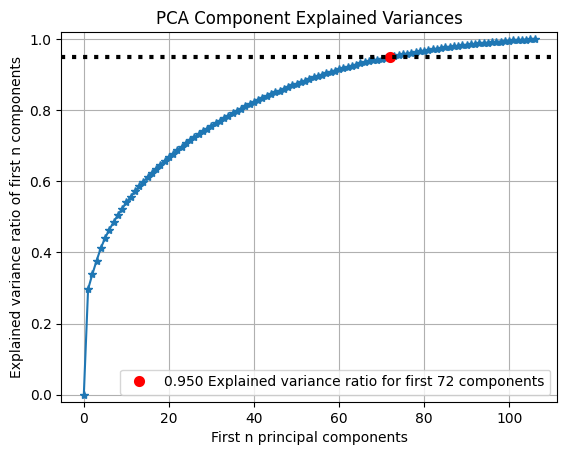

In [45]:
ax = skplt.decomposition.plot_pca_component_variance(
    pca_epoch, target_explained_variance=0.95
)
plt.plot()

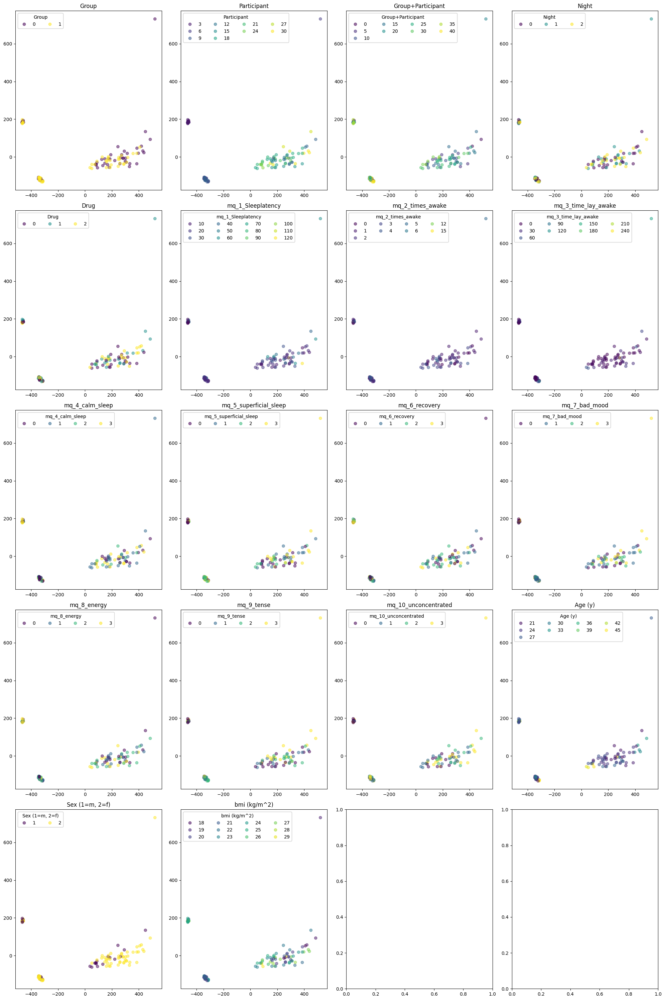

array([[<Axes: title={'center': 'Group'}>,
        <Axes: title={'center': 'Participant'}>,
        <Axes: title={'center': 'Group+Participant'}>,
        <Axes: title={'center': 'Night'}>],
       [<Axes: title={'center': 'Drug'}>,
        <Axes: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes: title={'center': 'mq_2_times_awake'}>,
        <Axes: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes: title={'center': 'mq_4_calm_sleep'}>,
        <Axes: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes: title={'center': 'mq_6_recovery'}>,
        <Axes: title={'center': 'mq_7_bad_mood'}>],
       [<Axes: title={'center': 'mq_8_energy'}>,
        <Axes: title={'center': 'mq_9_tense'}>,
        <Axes: title={'center': 'mq_10_unconcentrated'}>,
        <Axes: title={'center': 'Age (y)'}>],
       [<Axes: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes: title={'center': 'bmi (kg/m^2)'}>, <Axes: >, <Axes: >]],
      dtype=object)

In [46]:
plot_lower_dimensional_subspace(
    data=pca_epoch_data, mq=mq_epoch, dimensions=2, loc="upper left"
)

<Axes: xlabel='Sex (1=m, 2=f)', ylabel='count'>

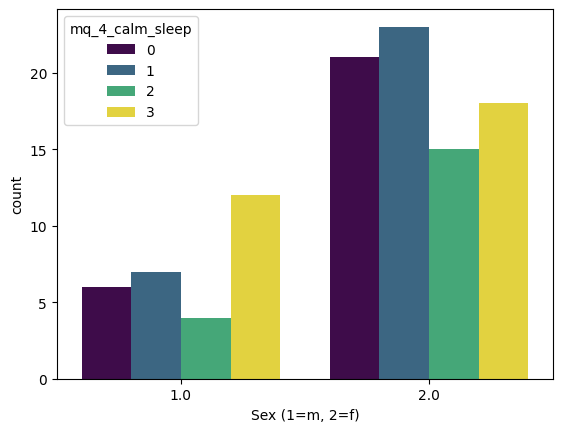

In [47]:
sns.countplot(
    data=mq_epoch, hue="mq_4_calm_sleep", x="Sex (1=m, 2=f)", palette="viridis"
)

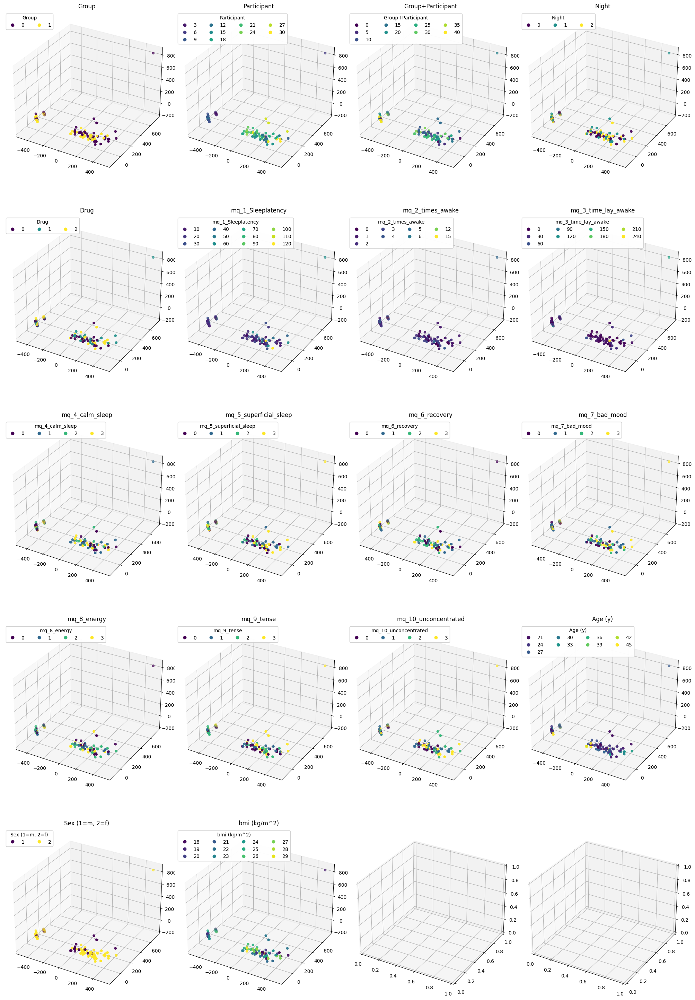

array([[<Axes3D: title={'center': 'Group'}>,
        <Axes3D: title={'center': 'Participant'}>,
        <Axes3D: title={'center': 'Group+Participant'}>,
        <Axes3D: title={'center': 'Night'}>],
       [<Axes3D: title={'center': 'Drug'}>,
        <Axes3D: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes3D: title={'center': 'mq_2_times_awake'}>,
        <Axes3D: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes3D: title={'center': 'mq_4_calm_sleep'}>,
        <Axes3D: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes3D: title={'center': 'mq_6_recovery'}>,
        <Axes3D: title={'center': 'mq_7_bad_mood'}>],
       [<Axes3D: title={'center': 'mq_8_energy'}>,
        <Axes3D: title={'center': 'mq_9_tense'}>,
        <Axes3D: title={'center': 'mq_10_unconcentrated'}>,
        <Axes3D: title={'center': 'Age (y)'}>],
       [<Axes3D: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes3D: title={'center': 'bmi (kg/m^2)'}>, <Axes3D: >,
        <Axes3D: >]], dtype=objec

In [48]:
plot_lower_dimensional_subspace(
    data=pca_epoch_data, mq=mq_epoch, dimensions=3, loc="upper left"
)

## 2.2 TSNE

In [49]:
tsne_2D_epoch = TSNE(n_components=2)
tsne_2D_epoch_data = tsne_2D_epoch.fit_transform(std_epoch_data)
pd.DataFrame(tsne_2D_epoch_data, index=mq_epoch.index).to_csv(
    "../data/tsne_2D_epoch_data.csv"
)
tsne_2D_epoch_data.shape

(106, 2)

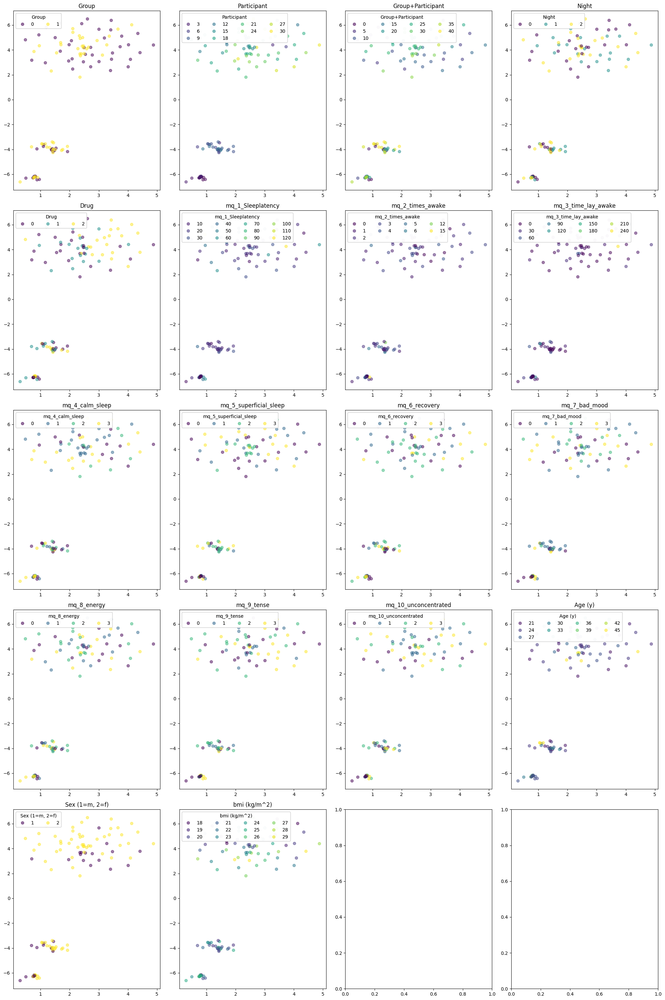

array([[<Axes: title={'center': 'Group'}>,
        <Axes: title={'center': 'Participant'}>,
        <Axes: title={'center': 'Group+Participant'}>,
        <Axes: title={'center': 'Night'}>],
       [<Axes: title={'center': 'Drug'}>,
        <Axes: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes: title={'center': 'mq_2_times_awake'}>,
        <Axes: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes: title={'center': 'mq_4_calm_sleep'}>,
        <Axes: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes: title={'center': 'mq_6_recovery'}>,
        <Axes: title={'center': 'mq_7_bad_mood'}>],
       [<Axes: title={'center': 'mq_8_energy'}>,
        <Axes: title={'center': 'mq_9_tense'}>,
        <Axes: title={'center': 'mq_10_unconcentrated'}>,
        <Axes: title={'center': 'Age (y)'}>],
       [<Axes: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes: title={'center': 'bmi (kg/m^2)'}>, <Axes: >, <Axes: >]],
      dtype=object)

In [50]:
plot_lower_dimensional_subspace(
    data=tsne_2D_epoch_data, mq=mq_epoch, dimensions=2, loc="upper left"
)

In [51]:
tsne_3D_epoch = TSNE(n_components=3)
tsne_3D_epoch_data = tsne_3D_epoch.fit_transform(std_epoch_data)
pd.DataFrame(tsne_3D_epoch_data, index=mq_epoch.index).to_csv(
    "../data/tsne_3D_epoch_data.csv"
)
tsne_3D_epoch_data.shape

(106, 3)

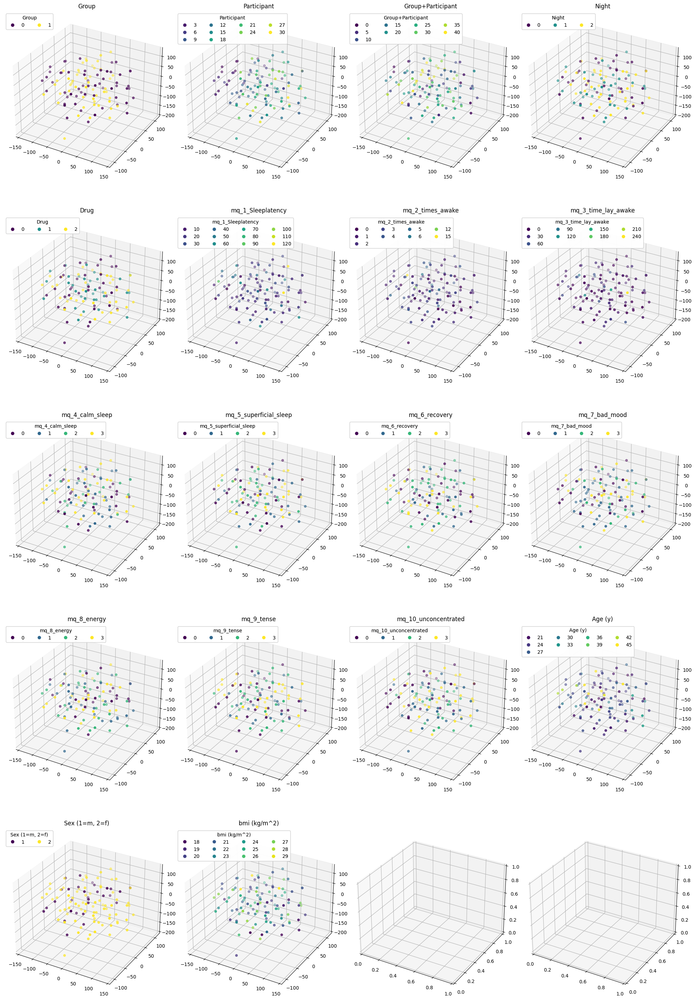

array([[<Axes3D: title={'center': 'Group'}>,
        <Axes3D: title={'center': 'Participant'}>,
        <Axes3D: title={'center': 'Group+Participant'}>,
        <Axes3D: title={'center': 'Night'}>],
       [<Axes3D: title={'center': 'Drug'}>,
        <Axes3D: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes3D: title={'center': 'mq_2_times_awake'}>,
        <Axes3D: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes3D: title={'center': 'mq_4_calm_sleep'}>,
        <Axes3D: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes3D: title={'center': 'mq_6_recovery'}>,
        <Axes3D: title={'center': 'mq_7_bad_mood'}>],
       [<Axes3D: title={'center': 'mq_8_energy'}>,
        <Axes3D: title={'center': 'mq_9_tense'}>,
        <Axes3D: title={'center': 'mq_10_unconcentrated'}>,
        <Axes3D: title={'center': 'Age (y)'}>],
       [<Axes3D: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes3D: title={'center': 'bmi (kg/m^2)'}>, <Axes3D: >,
        <Axes3D: >]], dtype=objec

In [52]:
plot_lower_dimensional_subspace(
    data=tsne_3D_epoch_data, mq=mq_epoch, dimensions=3, loc="upper left"
)

## 2.3 UMAP

In [53]:
umap_2D_epoch = UMAP(n_components=2)
umap_2D_epoch_data = umap_2D_epoch.fit_transform(std_epoch_data)
pd.DataFrame(umap_2D_epoch_data, index=mq_epoch.index).to_csv(
    "../data/umap_2D_epoch_data.csv"
)
umap_2D_epoch_data.shape

(106, 2)

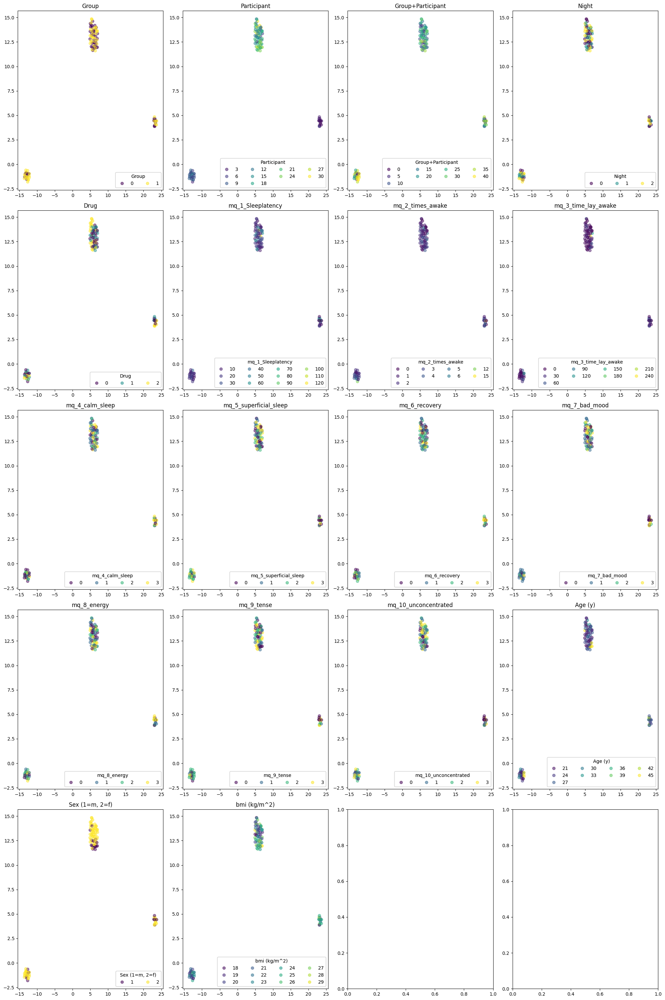

array([[<Axes: title={'center': 'Group'}>,
        <Axes: title={'center': 'Participant'}>,
        <Axes: title={'center': 'Group+Participant'}>,
        <Axes: title={'center': 'Night'}>],
       [<Axes: title={'center': 'Drug'}>,
        <Axes: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes: title={'center': 'mq_2_times_awake'}>,
        <Axes: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes: title={'center': 'mq_4_calm_sleep'}>,
        <Axes: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes: title={'center': 'mq_6_recovery'}>,
        <Axes: title={'center': 'mq_7_bad_mood'}>],
       [<Axes: title={'center': 'mq_8_energy'}>,
        <Axes: title={'center': 'mq_9_tense'}>,
        <Axes: title={'center': 'mq_10_unconcentrated'}>,
        <Axes: title={'center': 'Age (y)'}>],
       [<Axes: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes: title={'center': 'bmi (kg/m^2)'}>, <Axes: >, <Axes: >]],
      dtype=object)

In [58]:
plot_lower_dimensional_subspace(
    data=umap_2D_epoch_data, mq=mq_epoch, dimensions=2, loc="lower right"
)

In [55]:
umap_3D_epoch = UMAP(n_components=3)
umap_3D_epoch_data = umap_3D_epoch.fit_transform(std_epoch_data)
pd.DataFrame(umap_3D_epoch_data, index=mq_epoch.index).to_csv(
    "../data/umap_3D_epoch_data.csv"
)
umap_3D_epoch_data.shape

(106, 3)

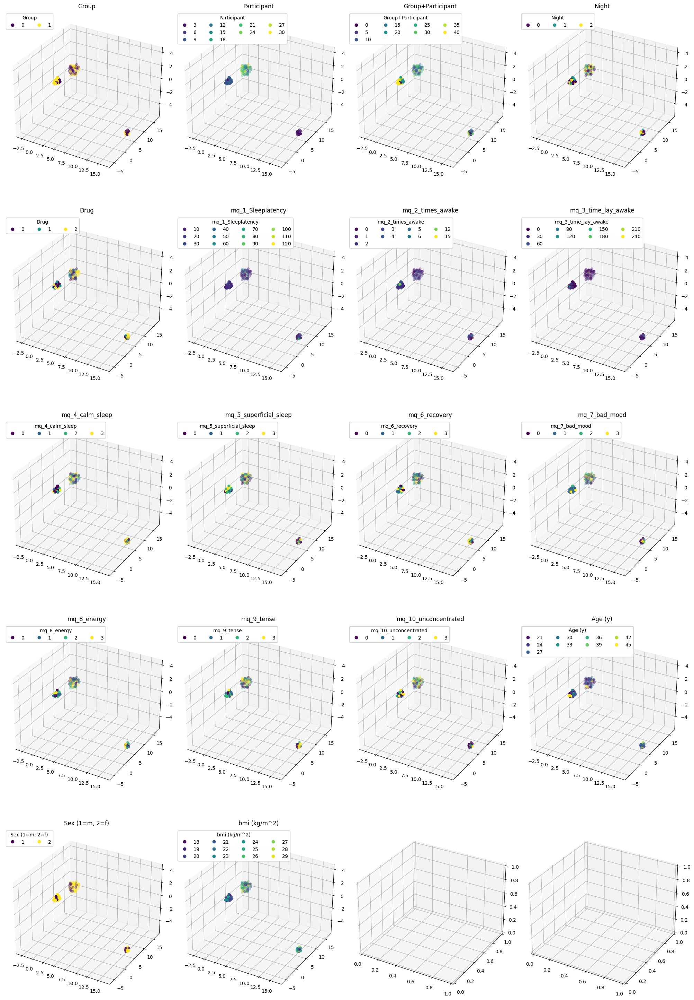

array([[<Axes3D: title={'center': 'Group'}>,
        <Axes3D: title={'center': 'Participant'}>,
        <Axes3D: title={'center': 'Group+Participant'}>,
        <Axes3D: title={'center': 'Night'}>],
       [<Axes3D: title={'center': 'Drug'}>,
        <Axes3D: title={'center': 'mq_1_Sleeplatency'}>,
        <Axes3D: title={'center': 'mq_2_times_awake'}>,
        <Axes3D: title={'center': 'mq_3_time_lay_awake'}>],
       [<Axes3D: title={'center': 'mq_4_calm_sleep'}>,
        <Axes3D: title={'center': 'mq_5_superficial_sleep'}>,
        <Axes3D: title={'center': 'mq_6_recovery'}>,
        <Axes3D: title={'center': 'mq_7_bad_mood'}>],
       [<Axes3D: title={'center': 'mq_8_energy'}>,
        <Axes3D: title={'center': 'mq_9_tense'}>,
        <Axes3D: title={'center': 'mq_10_unconcentrated'}>,
        <Axes3D: title={'center': 'Age (y)'}>],
       [<Axes3D: title={'center': 'Sex (1=m, 2=f)'}>,
        <Axes3D: title={'center': 'bmi (kg/m^2)'}>, <Axes3D: >,
        <Axes3D: >]], dtype=objec

In [56]:
plot_lower_dimensional_subspace(
    data=umap_3D_epoch_data, mq=mq_epoch, dimensions=3, loc="upper left"
)